# **CNN V.1**

## Requirements

In [1]:
%pip install -r requirements.txt

  Using cached sympy-1.14.0-py3-none-any.whl.metadata (12 kB)
  Using cached torch-2.6.0-cp311-none-macosx_11_0_arm64.whl.metadata (28 kB)
Using cached torch-2.6.0-cp311-none-macosx_11_0_arm64.whl (66.5 MB)
  Attempting uninstall: torch
    Found existing installation: torch 2.7.0
    Uninstalling torch-2.7.0:
      Successfully uninstalled torch-2.7.0
  Rolling back uninstall of torch
  Moving to /Users/filippo/miniconda3/envs/MAECap/bin/torchfrtrace
   from /private/var/folders/1y/qqxfq_4d3bv6t32r2gml_0qh0000gn/T/pip-uninstall-yp64yr1g/torchfrtrace
  Moving to /Users/filippo/miniconda3/envs/MAECap/bin/torchrun
   from /private/var/folders/1y/qqxfq_4d3bv6t32r2gml_0qh0000gn/T/pip-uninstall-yp64yr1g/torchrun
  Moving to /Users/filippo/miniconda3/envs/MAECap/include/ATen/
   from /Users/filippo/miniconda3/envs/MAECap/include/~Ten
  Moving to /Users/filippo/miniconda3/envs/MAECap/include/c10/core/
   from /Users/filippo/miniconda3/envs/MAECap/include/c10/~ore
  Moving to /Users/filippo/mi

## Libraries

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import librosa
import IPython.display as ipd
from tqdm import tqdm
from datetime import datetime

import pandas as pd
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
plt.style.use("seaborn-v0_8")

import torchaudio
import torch
import torch.nn as nn
import torch.nn.functional as F # it contains the activation functions
import torchaudio.transforms as T
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam

from torch_audiomentations import PitchShift, ApplyImpulseResponse
from audiomentations import TimeStretch
from pedalboard._pedalboard import Pedalboard
from pedalboard import Compressor

import csv

from more_itertools import chunked  # it is used to chunk the data into smaller parts in order not to overload MPS

## Device Selection

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") # windows
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu") # macOS

Device Check:

In [4]:
device

device(type='mps')

## Dataset

Required [ESC-50 Dataset](https://github.com/karolpiczak/ESC-50/archive/master.zip)

### Loading of the dataset of the metadata and dataset analysis

In [5]:
fn_csv = 'ESC-50-master/meta/esc50.csv'

ds_files = []  # File list
ds_labels = []  # Class list

ds = pd.read_csv(fn_csv)
ds.head()

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A


In [6]:
#unique class labels
unique_classes = ds['category'].unique()
print("Unique classes:", unique_classes)

# Check the number of unique class labels
print("Count:", len(unique_classes))

# Filling the lists with filenames and labels
ds_files = ds['filename'].values
pure_ds_labels = ds['category'].values

Unique classes: ['dog' 'chirping_birds' 'vacuum_cleaner' 'thunderstorm' 'door_wood_knock'
 'can_opening' 'crow' 'clapping' 'fireworks' 'chainsaw' 'airplane'
 'mouse_click' 'pouring_water' 'train' 'sheep' 'water_drops'
 'church_bells' 'clock_alarm' 'keyboard_typing' 'wind' 'footsteps' 'frog'
 'cow' 'brushing_teeth' 'car_horn' 'crackling_fire' 'helicopter'
 'drinking_sipping' 'rain' 'insects' 'laughing' 'hen' 'engine' 'breathing'
 'crying_baby' 'hand_saw' 'coughing' 'glass_breaking' 'snoring'
 'toilet_flush' 'pig' 'washing_machine' 'clock_tick' 'sneezing' 'rooster'
 'sea_waves' 'siren' 'cat' 'door_wood_creaks' 'crickets']
Count: 50


Check whether Ydata is balanced or not by plotting the histogram.

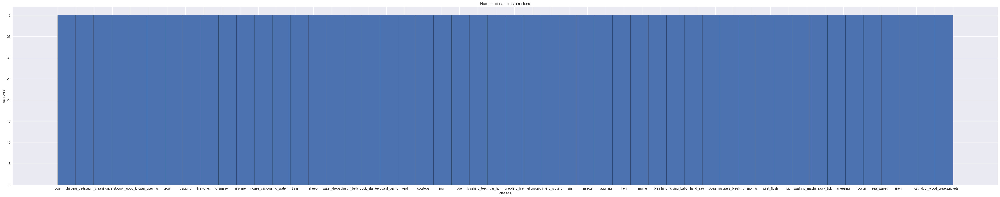

In [7]:
plt.figure(figsize=(55, 10))
plt.title("Number of samples per class")
plt.hist(np.asarray(pure_ds_labels), bins=50, edgecolor='black')
plt.xlabel("classes")
plt.ylabel("samples")
plt.show()

Transient sound:


Continous sound:


Intermittent sound:


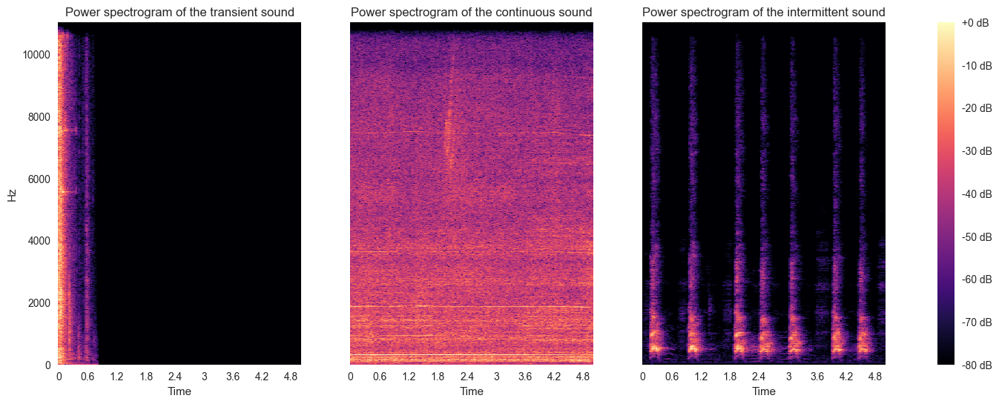

In [8]:
# Setup some filepaths
path = 'ESC-50-master/audio/'
file0 = path + '1-84705-A-39.wav'  # Transient
file1 = path + '1-19872-A-36.wav'  # Continuous
file2 = path + '1-30344-A-0.wav'   # Intermittent

name = ['transient', 'continuous', 'intermittent']

# Show audio player for each file
print('Transient sound:')
ipd.display(ipd.Audio(data=file0))
print('Continous sound:')
ipd.display(ipd.Audio(data=file1))
print('Intermittent sound:')
ipd.display(ipd.Audio(data=file2))

# Plot mel specs
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Fra quelli simili si fa confusione: se vuelve loco

Washing machine sound:


Helicopter sound:


Engine sound:


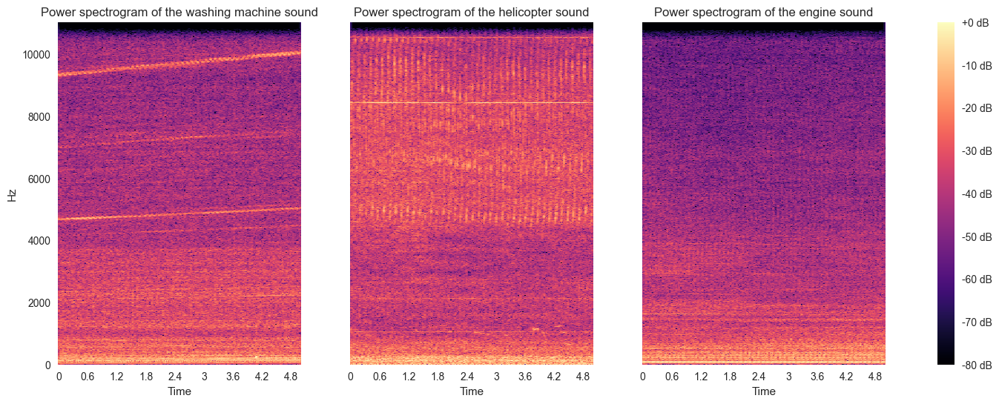

In [9]:
# Setup some filepaths
path = 'ESC-50-master/audio/'
file0 = path + '1-23996-B-35.wav'     # La Lavadora
file1 = path + '1-172649-A-40.wav'    # El helicoptero
file2 = path + '5-232272-A-44.wav'    # El coche


name = ['washing machine', 'helicopter', 'engine']

# Show audio player for each file
print('Washing machine sound:')
ipd.display(ipd.Audio(data=file0))
print('Helicopter sound:')
ipd.display(ipd.Audio(data=file1))
print('Engine sound:')
ipd.display(ipd.Audio(data=file2))

# Plot mel specs
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Se vogliamo mettere come c'è un'alta variabilità nella stessa classe. Vogliamo l'abbaio

First dog sound:


Second dog sound:


Third dog sound:


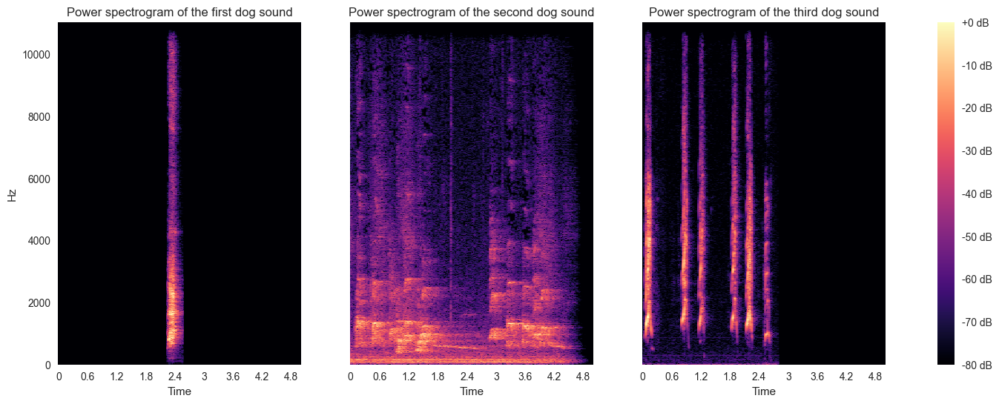

In [10]:
# Setup some filepaths
path = 'ESC-50-master/audio/'
file0 = path + '1-100032-A-0.wav'     # El perro limpio
file1 = path + '3-136288-A-0.wav'     # El perro en la lavadora
file2 = path + '5-9032-A-0.wav'       # El perro sucio

name = ['first dog', 'second dog', 'third dog']

# Show audio player for each file
print('First dog sound:')
ipd.display(ipd.Audio(data=file0))
print('Second dog sound:')
ipd.display(ipd.Audio(data=file1))
print('Third dog sound:')
ipd.display(ipd.Audio(data=file2))

# Plot mel specs
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Un'altra cosa da far notare è che non esiste una vera conoscenza e struttura di suoni ambientali ('o ritmo, o suono, 'o mare). Harmonic percussion

Harmonic component


Percussive component


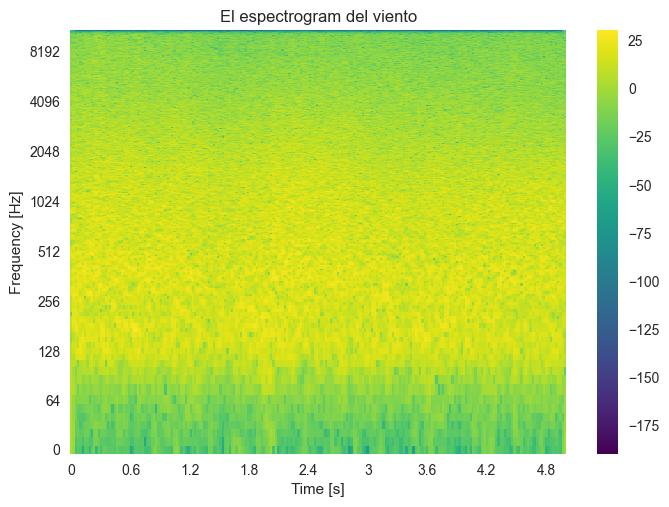

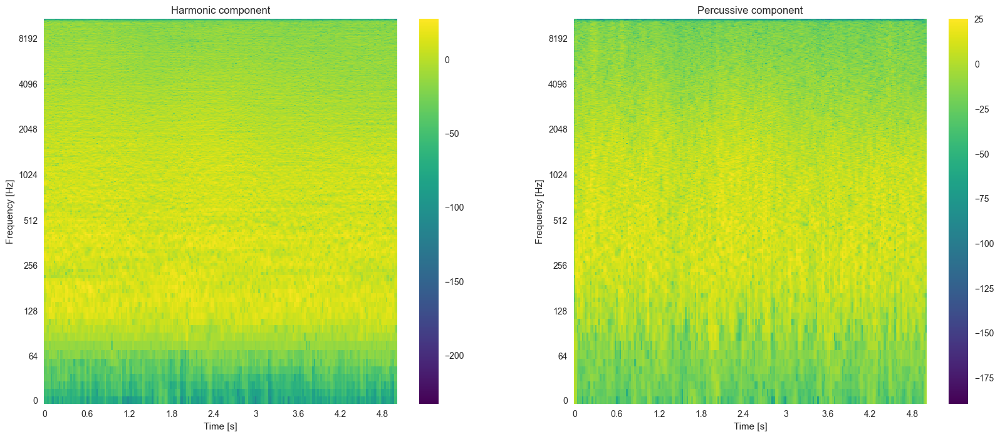

In [11]:
path = 'ESC-50-master/audio/'
file0 = path + '1-51037-A-16.wav'     # El viento

sound, sr = librosa.load(file0)

S = librosa.stft(sound)

librosa.display.specshow(20*np.log10(np.abs(S)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'El espectrogram del viento')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

Hmm, Prs = librosa.decompose.hpss(S)

plt.figure(figsize=(20,8))

plt.subplot(1, 2, 1)
librosa.display.specshow(20*np.log10(np.abs(Hmm)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'Harmonic component')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

plt.subplot(1, 2, 2)
librosa.display.specshow(20*np.log10(np.abs(Prs)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'Percussive component')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

print(f'Harmonic component')
ipd.display(ipd.Audio(librosa.istft(Hmm), rate=sr))
print(f'Percussive component')
ipd.display(ipd.Audio(librosa.istft(Prs), rate=sr))

## Pre-processing

Required [MIT Acoustical Reverberation Scene Statistics Survey](https://mcdermottlab.mit.edu/Reverb/IRMAudio/Audio.zip)

We decided to use audiomentations instead of the PyTorch one in order to have compressors.
-	Add different background noises with different SNRs
-	Pitch shifting
-	Time stretching
-	Dynamic range compression
-	Convolution with impulse responses

Background noise

In [12]:
def add_gaussian_noise(signal, min_snr_db, max_snr_db, activation_prob=1.0, device=device):
    """
    Adds Gaussian noise to a signal based on a random SNR value.
    Args:
        signal (torch.Tensor): Input signal tensor of shape (batch_size, num_channels, num_samples).
        min_snr_db (float): Minimum SNR in dB.
        max_snr_db (float): Maximum SNR in dB.
        activation_prob (float): Probability of applying noise. If 0, no noise is added.
        device (torch.device): Device to perform the computation on (e.g., 'cpu', 'cuda', 'mps').
    Returns:
        torch.Tensor: Signal with added Gaussian noise.
    """
    
    signal = signal.to(device)

    if torch.rand(1, device=device).item() > activation_prob:
        return signal 
    
    # RMS computation
    rms_signal = torch.sqrt(torch.mean(signal**2, dim=-1, keepdim=True))

    # Random SNR in dB
    snr_db = torch.empty(1, device=device).uniform_(min_snr_db, max_snr_db).item()
    snr_linear = 10 ** (snr_db / 20)

    # RMS of noise based on SNR
    rms_noise = rms_signal / snr_linear

    # Additive white Gaussian noise
    noise = torch.randn_like(signal, device=device) * rms_noise

    return signal + noise


Pitch Shifting

In [13]:
def pitch_shifter(signal, sr, min_semitones, max_semitones, activation_prob, device):
    """
    Shifts the pitch of the audio using torch-audiomentations, with device control.

    Args:
        signal (torch.Tensor): Audio signal (num_channels, num_samples) or (batch, num_channels, num_samples).
        sr (int): Sample rate of the signal.
        min_semitones (float): Minimum pitch shift in semitones.
        max_semitones (float): Maximum pitch shift in semitones.
        activation_prob (float): Probability of applying the pitch shift.
        device (torch.device): Device to perform the computation on (e.g., 'cpu', 'cuda', 'mps').

    Returns:
        torch.Tensor: The pitch-shifted (or original) signal.
    """
    if signal.dim() == 2:
        signal = signal.unsqueeze(0)  # Add batch dimension if needed

    signal = signal.to(device)

    pitch_shift = PitchShift(
        min_transpose_semitones=min_semitones,
        max_transpose_semitones=max_semitones,
        p=activation_prob,
        sample_rate=sr,
        output_type='dict'
    ).to(device)

    augmented = pitch_shift(signal, sample_rate=sr)
    augmented_signal = augmented['samples']

    if augmented_signal.shape[0] == 1:
        augmented_signal = augmented_signal.squeeze(0)  # Remove batch dim if present

    return augmented_signal


Time Stretching

In [14]:
def time_stretcher(signal, sample_rate, min_rate=0.8, max_rate=1.25, p=1.0):
    """
    Applys time stretching to an audio signal using audiomentations.
    Args:
        signal (torch.Tensor or np.ndarray): Input audio signal.
        sample_rate (int): Sample rate of the audio signal.
        min_rate (float): Minimum time stretch rate.
        max_rate (float): Maximum time stretch rate.
        p (float): Probability of applying the time stretch.
    Returns:
        torch.Tensor or np.ndarray: Time-stretched audio signal.
    """
    
    is_torch = False
    if isinstance(signal, torch.Tensor):
        is_torch = True
        signal_np = signal.cpu().numpy()
    else:
        signal_np = signal

    if signal_np.ndim > 1:
        signal_np = signal_np.squeeze()  # Rimuove dimensioni singole
        if signal_np.ndim > 1:
            signal_np = signal_np[0]  # Prendi il primo canale (mono)

    augmenter = TimeStretch(min_rate=min_rate, max_rate=max_rate, p=p)

    augmented = augmenter(samples=signal_np.astype(np.float32), sample_rate=sample_rate)

    if is_torch:
        return torch.from_numpy(augmented).to(signal.device)
    else:
        return augmented


Compressor

In [15]:
def compressor(signal, sample_rate, threshold_db=-24.0, ratio=4.0, attack_ms=10.0, release_ms=100.0):
    """
    Apply a compressor effect to a single audio signal using Pedalboard.

    Args:
        signal (torch.Tensor or np.ndarray): Input audio signal, shape [channels, samples] or [samples]
        sample_rate (int): Sample rate.
        threshold_db (float): Compressor threshold.
        ratio (float): Compression ratio.
        attack_ms (float): Attack time in ms.
        release_ms (float): Release time in ms.

    Returns:
        torch.Tensor or np.ndarray: Processed signal, same shape as input.
    """
    is_torch = False
    if isinstance(signal, torch.Tensor):
        is_torch = True
        signal_np = signal.cpu().numpy()
    else:
        signal_np = signal

    # Assicurati che il segnale sia 1D o 2D (canali x samples)
    signal_np = np.squeeze(signal_np)
    if signal_np.ndim == 3:
        raise ValueError("Input signal must be 1D or 2D, got 3D tensor.")
    elif signal_np.ndim == 1:
        # forma accettata mono [samples]
        pass
    elif signal_np.ndim == 2:
        # forma accettata stereo/ multicanale [channels, samples]
        pass
    else:
        raise ValueError(f"Unexpected signal shape: {signal_np.shape}")

    signal_np = signal_np.astype(np.float32)

    board = Pedalboard([
        Compressor(
            threshold_db=threshold_db,
            ratio=ratio,
            attack_ms=attack_ms,
            release_ms=release_ms
        )
    ])

    processed = board(signal_np, sample_rate)

    if is_torch:
        processed_tensor = torch.from_numpy(processed)
        if signal.device.type != 'cpu':
            processed_tensor = processed_tensor.to(signal.device)
        return processed_tensor
    else:
        return processed


Impulse respones convolution

In [16]:
def convolver_torch_audio(signal, sr, activation_prob, ir_path="MIT_Acoustical_Reverberation_Scene", device=device):
    """
    Applies convolution with an impulse response to an audio signal using torch-audiomentations.

    Args:
        signal (torch.Tensor): Audio tensor (num_channels, num_samples) or (batch, num_channels, num_samples).
        sr (int): Sample rate of the signal.
        activation_prob (float): Probability of applying the transform.
        ir_path (str): Path to directory containing impulse response WAV files.
        device (torch.device): Device to perform the computation on (e.g., 'cpu', 'cuda', 'mps').

    Returns:
        torch.Tensor: The convolved audio signal.
    """
    if signal.dim() == 2:
        signal = signal.unsqueeze(0)

    signal = signal.to(device)

    convolve = ApplyImpulseResponse(
        ir_paths=ir_path,
        p=activation_prob,
        output_type='dict'
    ).to(device)

    augmented = convolve(signal, sample_rate=sr)
    augmented_signal = augmented["samples"]

    if augmented_signal.shape[0] == 1:
        augmented_signal = augmented_signal.squeeze(0)

    return augmented_signal.to(device)


Pre-processing for a single track

In [17]:
def pre_processing_signal(
    signal, sr,
    label,
    gaussianParameters=None,
    pitchParameters=None,
    timeStretchParameters=None,
    compressorParameters=None,
    convolverParameters=None,
    device=device
):
    """
    Applies a series of PyTorch-based audio augmentations to a signal.

    Args:
        signal (torch.Tensor): Audio signal (num_channels, num_samples) or (batch, num_channels, num_samples).
        sr (int): Sample rate of the signal.
        label (str): Corresponding label.
        gaussianParameters (tuple): (min_snr_db, max_snr_db, activation_prob)
        pitchParameters (tuple): (min_semitones, max_semitones, activation_prob)
        timeStretchParameters (tuple): (min_rate, max_rate, activation_prob, leave_length_unchanged)
        compressorParameters (tuple): (threshold_db, ratio, attack_ms, release_ms)
        convolverParameters (int): (activation_prob)
        device (torch.device): Device to run the augmentations on (default: 'cpu').
    
    Returns:
        tuple: (List of augmented signals, list of corresponding labels)
    """
    signals = []
    labels = []

    # Ensure 3D format (B, C, T)
    if signal.dim() == 2:
        signal = signal.unsqueeze(0)

    signals.append(signal)
    labels.append(label)

    if gaussianParameters is not None:
        min_snr_db, max_snr_db, activation_prob = gaussianParameters
        signal_1 = add_gaussian_noise(signal, min_snr_db, max_snr_db, activation_prob, device=device)
        #print(f"Added Gaussian noise with SNR range: {min_snr_db} to {max_snr_db} dB, activation probability: {activation_prob}")
        signals.append(signal_1)
        labels.append(label)
    
    if pitchParameters is not None:
        min_semitones, max_semitones, activation_prob = pitchParameters
        signal_2 = pitch_shifter(signal, sr, min_semitones, max_semitones, activation_prob, device=device)
        #print(f"Pitch shifted by {min_semitones} to {max_semitones} semitones, activation probability: {activation_prob}")
        signals.append(signal_2)
        labels.append(label)

    if timeStretchParameters is not None:
        min_rate, max_rate, activation_prob, leave_length_unchanged = timeStretchParameters
        
        signal_3 = time_stretcher(signal, sr, min_rate, max_rate, activation_prob)
        #print(f"Time stretched/compressed by a factor of {min_rate} to {max_rate}, activation probability: {activation_prob}, leave length unchanged: {leave_length_unchanged}")
        signals.append(signal_3)
        labels.append(label)

    if compressorParameters is not None:
        threshold_db, ratio, attack_ms, release_ms = compressorParameters
        signal_4 = compressor(signal, sr, threshold_db, ratio, attack_ms, release_ms)
        #print(f"Applied compressor with threshold: {threshold_db} dB, ratio: {ratio}, attack: {attack_ms} ms, release: {release_ms} ms")
        signals.append(signal_4)
        labels.append(label)

    if convolverParameters is not None:
        activation_prob = convolverParameters
        signal_5 = convolver_torch_audio(signal, sr, activation_prob, device=device)
        #print(f"Applied convolution with impulse response, activation probability: {activation_prob}")
        signals.append(signal_5)
        labels.append(label)

    return signals, labels


Pre-processing for the entire dataset

In [18]:
def pre_processing_dataset(
    Xdata, sr,
    Ydata,
    gaussianParameters=None,
    pitchParameters=None,
    timeStretchParameters=None,
    compressorParameters=None,
    convolverParameters=None,
    device=device
):
    """
    Pre-processes a dataset of audio signals by applying various augmentations.
    Args:
        Xdata (list or np.ndarray): List or array of audio signals.
        sr (int): Sample rate of the audio signals.
        Ydata (list or np.ndarray): List or array of corresponding labels.
        gaussianParameters (tuple): Parameters for Gaussian noise (min_snr_db, max_snr_db, activation_prob).
        pitchParameters (tuple): Parameters for pitch shift (min_semitones, max_semitones, activation_prob).
        timeStretchParameters (tuple): Parameters for time stretching (min_rate, max_rate, activation_prob, leave_length_unchanged).
        compressorParameters (tuple): Parameters for compression (threshold_db, ratio, attack_ms, release_ms).
        convolverParameters (int): Activation probability for convolution with impulse response.
        device (torch.device): Device to run the processing on (default is 'cpu' or 'mps' for macOS).
    Returns:
        tuple: Processed signals as a tensor of shape [N, 1, 220500] and corresponding labels as a tensor.
    """
    
    processed_signals = []
    processed_labels = []

    if device.type == 'mps':
        # Ensure the device is set correctly for macOS
        BATCH_SIZE = 32 # Adjust as needed

        for batch in tqdm(chunked(zip(Xdata, Ydata), BATCH_SIZE), total=(len(Xdata) + BATCH_SIZE - 1)//BATCH_SIZE, desc="Pre-processing"):
            for signal, label in batch:
                signals, labels = pre_processing_signal(
                    signal, sr, label,
                    gaussianParameters,
                    pitchParameters,
                    timeStretchParameters,
                    compressorParameters,
                    convolverParameters,
                    device=device
                )

                # Accumula ogni singolo segnale (signals è presumibilmente una lista)
                for sig in signals:
                    if isinstance(sig, np.ndarray):
                        sig_tensor = torch.from_numpy(sig)
                    else:
                        sig_tensor = sig

                    sig_tensor = sig_tensor.float()

                    # Rimuovi dimensioni singleton inutili
                    sig_tensor = sig_tensor.squeeze()

                    # Assicurati che sia [1, samples]
                    if sig_tensor.ndim == 1:
                        sig_tensor = sig_tensor.unsqueeze(0)

                    target_len = 220500
                    current_len = sig_tensor.shape[-1]

                    if current_len < target_len:
                        pad_len = target_len - current_len
                        sig_tensor = F.pad(sig_tensor, (0, pad_len))
                    elif current_len > target_len:
                        sig_tensor = sig_tensor[:, :target_len]

                    # Sposta sul device corretto
                    sig_tensor = sig_tensor.to('cpu')               # NON MODIFICARE! SE SI METTE SU DEVICE, NON FUNZIONA PERCHÉ NON HA ABBASTANZA MEMORIA
                    processed_signals.append(sig_tensor)

                processed_labels.extend(labels)
    else:
        for signal, label in tqdm(zip(Xdata, Ydata), total=len(Xdata), desc="Pre-processing"):
            signals, labels = pre_processing_signal(
                signal, sr, label,
                gaussianParameters,
                pitchParameters,
                timeStretchParameters,
                compressorParameters,
                convolverParameters,
                device=device
            )

            for sig in signals:
                if isinstance(sig, np.ndarray):
                    sig_tensor = torch.from_numpy(sig)
                else:
                    sig_tensor = sig

                sig_tensor = sig_tensor.float()
                sig_tensor = sig_tensor.squeeze()

                if sig_tensor.ndim == 1:
                    sig_tensor = sig_tensor.unsqueeze(0)

                target_len = 220500
                current_len = sig_tensor.shape[-1]

                if current_len < target_len:
                    pad_len = target_len - current_len
                    sig_tensor = F.pad(sig_tensor, (0, pad_len))
                elif current_len > target_len:
                    sig_tensor = sig_tensor[:, :target_len]
                sig_tensor = sig_tensor.to(device)

                processed_signals.append(sig_tensor)

            processed_labels.extend(labels)

    # Stack into a single tensor: [N, 1, 220500]
    all_signals = torch.stack(processed_signals)
    all_labels = torch.tensor(processed_labels)

    return all_signals, all_labels


## Load signals

Nos cargamos todos los signales

In [19]:
pure_signals = []
audio_folder = "ESC-50-master/audio/"

for file in ds_files:
    filepath = os.path.join(audio_folder, file)
    waveform, sr = torchaudio.load(filepath)  # waveform shape: (channels, samples), tensor type: torch.Tensor
    pure_signals.append(waveform)

Check pre pre-processing

In [20]:
print(f"Number of audio files: {len(pure_signals)}")
print(f"Number of audio labels: {len(pure_ds_labels)}")

Number of audio files: 2000
Number of audio labels: 2000


Lista -> tensors

In [21]:
pure_signals_tensor = torch.stack(pure_signals)  # shape: (num_samples, channels, samples)

# Label mapping: map unique labels to indices
unique_labels = list(dict.fromkeys(pure_ds_labels))
label_mapping = {label: idx for idx, label in enumerate(unique_labels)}

# Numerical labels as tensor
Ydata = torch.tensor([label_mapping[label] for label in pure_ds_labels], dtype=torch.long)

print(f'Pure signals tensor shape: {pure_signals_tensor.shape}')
print(f'Numerical labels tensor shape: {Ydata.shape}')

Pure signals tensor shape: torch.Size([2000, 1, 220500])
Numerical labels tensor shape: torch.Size([2000])


## **Data Augmentation**

Dataset splitting with cross-validation, inspired by [Heittola, 2017](https://inria.hal.science/hal-01627981/)

Stratified K-Fold Cross Validation: ensures that each fold maintains the same class distribution as the original dataset

In [22]:
seed = 1234

train_size = 0.7
val_size = 0.2
test_size = 0.1


X_train, X_temp, y_train, y_temp = train_test_split(pure_signals_tensor, Ydata, train_size=train_size, random_state=seed, shuffle=True , stratify=Ydata)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=np.round(test_size/(test_size + val_size),2), random_state=seed, shuffle=True , stratify=y_temp)


# Shapes for each partition
print('X_train shape: {} \nX_val shape: {} \nX_test shape: {} \ny_train shape: {} \ny_val shape: {} \ny_test shape: {} \n'.format(X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape))


X_train shape: torch.Size([1400, 1, 220500]) 
X_val shape: torch.Size([402, 1, 220500]) 
X_test shape: torch.Size([198, 1, 220500]) 
y_train shape: torch.Size([1400]) 
y_val shape: torch.Size([402]) 
y_test shape: torch.Size([198]) 



In [23]:
X_train_aug, y_train_aug = pre_processing_dataset(
    Xdata=X_train,
    sr=sr,
    Ydata=y_train,
    gaussianParameters = (5, 40, 1),
    pitchParameters = (-5, 5, 1),
    timeStretchParameters = (0.8, 1.25, 1, True),
    compressorParameters = (-20, 4.0, 10.0, 100.0),
    convolverParameters = 1
)

Pre-processing: 100%|██████████| 44/44 [02:13<00:00,  3.04s/it]


In [24]:
print('X_train_aug shape: {} \ny_train_aug shape: {} \nX_val shape: {} \ny_val shape: {} \nX_test shape: {} \ny_test shape: {}\n'.format(X_train_aug.shape, y_train_aug.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape))

type_of_processing = [
    "Original",
    "Gaussian Noise",
    "Pitch Shift",
    "Time Stretch",
    "Compressor",
    "Convolver"
]

# Listen to the first 5 augmented audio files
for i in range(6):
    print(type_of_processing[i])
    ipd.display(ipd.Audio(data=X_train_aug[i].cpu().numpy(), rate=sr))

X_train_aug shape: torch.Size([8400, 1, 220500]) 
y_train_aug shape: torch.Size([8400]) 
X_val shape: torch.Size([402, 1, 220500]) 
y_val shape: torch.Size([402]) 
X_test shape: torch.Size([198, 1, 220500]) 
y_test shape: torch.Size([198])

Original


Gaussian Noise


Pitch Shift


Time Stretch


Compressor


Convolver


## **Feature Extraction**

In [25]:
def mel_spectrogram_dataset(
    X, sr=22050, n_mels=128, fmax=None, device=device, batch_size=32, n_fft=1024, hop_length=128
):
    """
    Computes the Mel spectrogram for a dataset of audio signals drawing inspiration from librosa.
    Args:
        X (torch.Tensor): Input audio signals of shape [N, 1, T] or [N, T].
        sr (int): Sample rate of the audio signals.
        n_mels (int): Number of Mel bands to generate.
        fmax (float): Maximum frequency for the Mel filter bank. If None, defaults to sr // 2.
        device (torch.device): Device to perform the computation on (e.g., 'cpu', 'cuda', 'mps').
        batch_size (int): Batch size for processing.
        n_fft (int): FFT size for the Mel spectrogram.
        hop_length (int): Hop length for the Mel spectrogram.
    Returns:
        torch.Tensor: Mel spectrograms of shape [N, n_mels, time].
    """

    if fmax is None:
        fmax = sr // 2  # default librosa
    
    mel_transform = T.MelSpectrogram(
        sample_rate=sr,
        n_fft=n_fft,
        hop_length=hop_length,
        n_mels=n_mels,
        f_max=fmax,
        power=2.0,
        mel_scale='slaney',
        norm='slaney'
    ).to(device)

    db_transform = T.AmplitudeToDB(stype='power', top_db=80).to(device)

    results = []

    N = X.shape[0]
    for start_idx in tqdm(range(0, N, batch_size), desc="Mel Spectrogram batch"):
        end_idx = min(start_idx + batch_size, N)
        batch = X[start_idx:end_idx].to(device)

        mel = mel_transform(batch)       # [B, n_mels, time]
        mel_db = db_transform(mel)       # [B, n_mels, time] in dB

        mel_db = mel_db.cpu()
        results.append(mel_db)

    return torch.cat(results, dim=0)


In [26]:
mel_spegrams_train = mel_spectrogram_dataset(X_train_aug)
print('mel_spegrams_train shape: {}'.format(mel_spegrams_train.shape))

mel_spegrams_val = mel_spectrogram_dataset(X_val)
print('mel_spegrams_val shape: {}'.format(mel_spegrams_val.shape))

mel_spegrams_test = mel_spectrogram_dataset(X_test)
print('mel_spegrams_test shape: {}'.format(mel_spegrams_test.shape))

Mel Spectrogram batch: 100%|██████████| 263/263 [00:39<00:00,  6.65it/s]


mel_spegrams_train shape: torch.Size([8400, 1, 128, 1723])


Mel Spectrogram batch: 100%|██████████| 13/13 [00:05<00:00,  2.52it/s]


mel_spegrams_val shape: torch.Size([402, 1, 128, 1723])


Mel Spectrogram batch: 100%|██████████| 7/7 [00:00<00:00,  9.66it/s]

mel_spegrams_test shape: torch.Size([198, 1, 128, 1723])


In [27]:
X_train_exp = mel_spegrams_train.permute(0, 2, 3, 1)
X_val_exp = mel_spegrams_val.permute(0, 2, 3, 1)
X_test_exp = mel_spegrams_test.permute(0, 2, 3, 1)

print('X_train_exp shape: {} \nX_val_exp shape: {} \nX_test_exp shape: {}'.format(X_train_exp.shape, X_val_exp.shape, X_test_exp.shape))

X_train_exp shape: torch.Size([8400, 128, 1723, 1]) 
X_val_exp shape: torch.Size([402, 128, 1723, 1]) 
X_test_exp shape: torch.Size([198, 128, 1723, 1])


# Model Definition

Funzione da scrivere a mano per il padding perché su PyTorch non c'è uguale a TF

In [28]:
def get_same_padding(kernel_size, stride):
    if isinstance(kernel_size, tuple):
        pad_h = max(kernel_size[0] - stride[0], 0)
        pad_w = max(kernel_size[1] - stride[1], 0)
        return (pad_w // 2, pad_w - pad_w // 2, pad_h // 2, pad_h - pad_h // 2)  # left, right, top, bottom
    else:
        pad = max(kernel_size - stride, 0)
        return (pad // 2, pad - pad // 2)


In [29]:
class CBA(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride):
        super(CBA, self).__init__()
        padding = get_same_padding(kernel_size, stride)
        self.pad = nn.ConstantPad2d(padding, 0)  # (left, right, top, bottom)
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=0)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.pad(x)
        x = self.conv(x)
        x = self.bn(x)
        x = self.relu(x)
        return x


class CNNV1(nn.Module):
    def __init__(self, input_shape, num_classes=50):
        super(CNNV1, self).__init__()
        in_channels = input_shape[2] if len(input_shape) == 3 else 1

        # Branch 1
        self.cba1_1 = CBA(in_channels, 32, (1,8), (1,2))
        self.cba1_2 = CBA(32, 32, (8,1), (2,1))
        self.cba1_3 = CBA(32, 64, (1,8), (1,2))
        self.cba1_4 = CBA(64, 64, (8,1), (2,1))

        # Branch 2
        self.cba2_1 = CBA(in_channels, 32, (1,16), (1,2))
        self.cba2_2 = CBA(32, 32, (16,1), (2,1))
        self.cba2_3 = CBA(32, 64, (1,16), (1,2))
        self.cba2_4 = CBA(64, 64, (16,1), (2,1))

        # Branch 3
        self.cba3_1 = CBA(in_channels, 32, (1,32), (1,2))
        self.cba3_2 = CBA(32, 32, (32,1), (2,1))
        self.cba3_3 = CBA(32, 64, (1,32), (1,2))
        self.cba3_4 = CBA(64, 64, (32,1), (2,1))

        # Branch 4
        self.cba4_1 = CBA(in_channels, 32, (1,64), (1,2))
        self.cba4_2 = CBA(32, 32, (64,1), (2,1))
        self.cba4_3 = CBA(32, 64, (1,64), (1,2))
        self.cba4_4 = CBA(64, 64, (64,1), (2,1))

        # After concatenation
        self.cba5_1 = CBA(64, 128, (1,16), (1,2))
        self.cba5_2 = CBA(128, 128, (16,1), (2,1))

        self.global_avg_pool = nn.AdaptiveAvgPool2d((1,1))
        self.fc = nn.Linear(128, num_classes)

    def forward(self, x):
        # x shape: (batch, H, W, C) -> (batch, C, H, W)
        if x.shape[1] != 1 and x.shape[1] != 3:
            # Assume input is (batch, H, W, C)
            x = x.permute(0, 3, 1, 2)

        # Branches
        x1 = self.cba1_1(x)
        x1 = self.cba1_2(x1)
        x1 = self.cba1_3(x1)
        x1 = self.cba1_4(x1)

        x2 = self.cba2_1(x)
        x2 = self.cba2_2(x2)
        x2 = self.cba2_3(x2)
        x2 = self.cba2_4(x2)

        x3 = self.cba3_1(x)
        x3 = self.cba3_2(x3)
        x3 = self.cba3_3(x3)
        x3 = self.cba3_4(x3)

        x4 = self.cba4_1(x)
        x4 = self.cba4_2(x4)
        x4 = self.cba4_3(x4)
        x4 = self.cba4_4(x4)

        # Element-wise sum
        x = x1 + x2 + x3 + x4

        x = self.cba5_1(x)
        x = self.cba5_2(x)

        x = self.global_avg_pool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        x = F.softmax(x, dim=1)
        return x

# Model Testing

In [30]:
def train_model(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=1000, patience=100):
    model.to(device)
    best_acc = 0
    best_epoch = 0
    best_model_state = None

    history = {
        "train_loss": [],
        "val_loss": [],
        "train_acc": [],
        "val_acc": []
    }

    patience_counter = 0

    for epoch in range(num_epochs):
        model.train()
        epoch_loss = 0
        correct = 0

        for inputs, targets in train_loader:
            inputs, targets = inputs.to(device), targets.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, targets)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            _, predicted = outputs.max(1)
            correct += (predicted == targets).sum().item()

        train_acc = correct / len(train_loader.dataset)
        history["train_loss"].append(epoch_loss)
        history["train_acc"].append(train_acc)

        # Validation
        model.eval()
        val_loss = 0
        val_correct = 0

        with torch.no_grad():
            for inputs, targets in val_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                val_loss += loss.item()
                _, predicted = outputs.max(1)
                val_correct += (predicted == targets).sum().item()

        val_acc = val_correct / len(val_loader.dataset)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        print(f"Epoch {epoch+1}: Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}")

        if val_acc > best_acc:
            best_acc = val_acc
            best_epoch = epoch
            best_model_state = model.state_dict()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping at epoch {epoch+1}")
                break

    print(f"Best validation accuracy: {best_acc:.4f} at epoch {best_epoch+1}")
    model.load_state_dict(best_model_state)
    return model, history

In [31]:
def save_training_history_to_csv(history, filename="CNNV1_training_log.csv"):
    keys = history.keys()
    with open(filename, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(["epoch"] + list(keys))
        for epoch in range(len(history["train_loss"])):
            row = [epoch + 1] + [history[key][epoch] for key in keys]
            writer.writerow(row)
    print(f"Training log salvato in: {filename}")


In [32]:
def plot_training_history(history):

    epochs = range(1, len(history["train_acc"]) + 1)

    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, history["train_acc"], label="Train Accuracy")
    plt.plot(epochs, history["val_acc"], label="Validation Accuracy")
    plt.title("Accuracy Over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, history["train_loss"], label="Train Loss")
    plt.plot(epochs, history["val_loss"], label="Validation Loss")
    plt.title("Loss Over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    plt.tight_layout()
    plt.show()

In [33]:
class RSSDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)  # shape: (B, T, C, L)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

In [34]:
def evaluate_model(model, dataloader, device):
    model.eval()
    y_true = []
    y_pred = []

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            y_pred.extend(preds)
            y_true.extend(targets.numpy())

    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.show()

    accuracy = np.mean(np.array(y_true) == np.array(y_pred))
    print(f"Test accuracy: {accuracy:.4f}")

In [35]:
# Creazione dei dataset
train_dataset = RSSDataset(X_train_exp, y_train_aug)
val_dataset = RSSDataset(X_val_exp, y_val)
test_dataset = RSSDataset(X_test_exp, y_test)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)
test_loader = DataLoader(test_dataset, batch_size=32)

print(f"Input shape: ", X_train_exp.shape)

/var/folders/1y/qqxfq_4d3bv6t32r2gml_0qh0000gn/T/ipykernel_278/2919892748.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X, dtype=torch.float32)  # shape: (B, T, C, L)
/var/folders/1y/qqxfq_4d3bv6t32r2gml_0qh0000gn/T/ipykernel_278/2919892748.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.y = torch.tensor(y, dtype=torch.long)


Input shape:  torch.Size([8400, 128, 1723, 1])


In [36]:
input_shape = X_train_exp.shape[1:]  # (H, W, C)
num_classes = 50

# Creazione modello
model = CNNV1(input_shape=input_shape, num_classes=num_classes)

# Ottimizzatore Adam con amsgrad
optimizer = Adam(model.parameters(), lr=5e-5, amsgrad=True, weight_decay=1e-6)  # corrisponde a decay in Keras

# Loss function
criterion = nn.CrossEntropyLoss()

# Allenamento
print("Inizio del training...")
print(device)
model, history = train_model(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=300, patience=10)

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
csv_filename = f"CNNV1_training_log_{timestamp}.csv"
save_training_history_to_csv(history, filename=csv_filename)

# Plot
plot_training_history(history)

# Valutazione
evaluate_model(model, test_loader, device)


Inizio del training...
mps


KeyboardInterrupt: 